# ESRI Shape File to GeoJSON Conversion Example

## ABARES Regions

In [1]:
import os
import time

from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt
import folium
import pandas as pd
import geopandas as gpd

### Load ESRI Shape file

In [2]:
georegions = gpd.read_file('../datasets/aagis/aagis_asgs16v1_g5a.shp')
georegions = georegions.to_crs('EPSG:3577') ### EPSG:3577: GDA94 / Australian Albers projection

### List Regions in ShapeFile

In [3]:
print("Shape:", georegions.shape)
georegions.head(32)

Shape: (32, 5)


,aagis,class,name,zone,geometry
0,111,111,NSW Far West,Pastoral,"POLYGON ((1381232.077 -3228837.951, 1435713.39..."
1,121,121,NSW North West Slopes and Plains,Wheat Sheep,"POLYGON ((1763051.524 -3226334.448, 1763075.26..."
2,122,122,NSW Central West,Wheat Sheep,"POLYGON ((1610738.796 -3439070.810, 1612560.43..."
3,123,123,NSW Riverina,Wheat Sheep,"POLYGON ((1239515.375 -3628445.370, 1237266.06..."
4,131,131,NSW Tablelands (Northern Central and Southern),High Rainfall,"POLYGON ((1980343.681 -3226930.895, 1980244.99..."
5,132,132,NSW Coastal,High Rainfall,"MULTIPOLYGON (((1602444.179 -4186562.998, 1602..."
6,221,221,VIC Mallee,Wheat Sheep,"POLYGON ((823579.208 -3738523.338, 823584.850 ..."
7,222,222,VIC Wimmera,Wheat Sheep,"POLYGON ((903340.855 -3929172.576, 903265.299 ..."
8,223,223,VIC Central North,Wheat Sheep,"POLYGON ((1220289.099 -3976307.280, 1220255.21..."
9,231,231,VIC Southern and Eastern Victoria,High Rainfall,"MULTIPOLYGON (((1247280.679 -4351791.256, 1247..."


### Write to GeoJSON File Format

In [4]:
georegions.to_file("../datasets/aagis/aagis_asgs16v1_g5a.json", driver="GeoJSON")

C:\Users\steven.tuften\Miniconda3\envs\GeospatialConversions\lib\site-packages\geopandas\io\file.py:362: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  pd.Int64Index,


## Plot ABARES regions by Zone on a map

<AxesSubplot:>

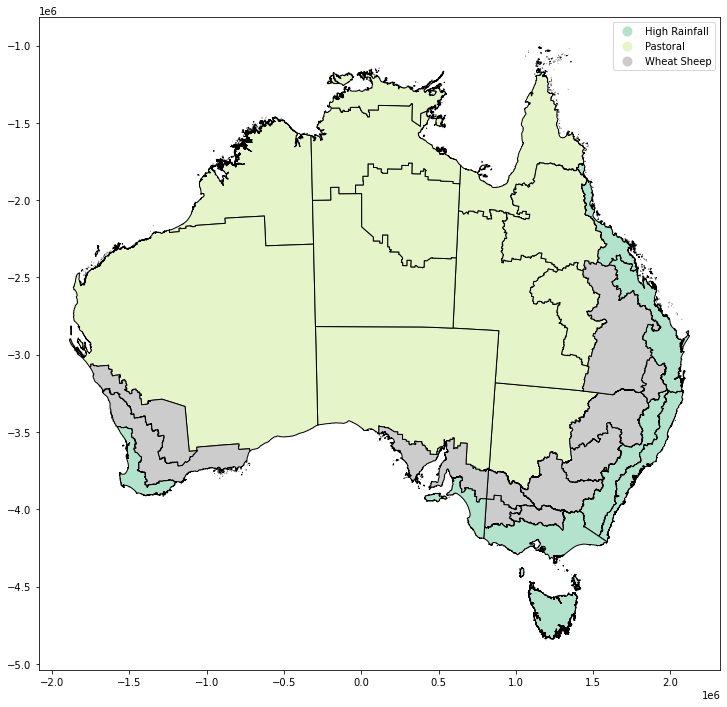

In [5]:
georegions.plot(column="zone", figsize=(18,12), cmap='Pastel2', legend=True, edgecolor="black")

In [7]:
georegions.explore(column='zone', # make choropleth based on Commodity description
     tooltip=["zone","class", "name"], popup=True, # show all values in popup (on click)
     tiles="CartoDB positron", # use "CartoDB positron" tiles
     cmap="Set1", # use "Set1" matplotlib colormap
     style_kwds=dict(color="black") ) # use black outline